In [1]:
from typing import List, Optional, Dict, Any, Iterable
import polars as pl
import seaborn as sns
import re
import numpy.typing as npt
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import pyarrow as pa
from glob import glob
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from zipfile import ZipFile, ZIP_LZMA, ZIP_DEFLATED
import os
import pyarrow as pa
import pyarrow.dataset as ds
from pyarrow import csv
import pyarrow.parquet as pq
import altair as alt
import seaborn.objects as so
alt.data_transformers.disable_max_rows()
alt.renderers.enable("svg")
theme = {
    **sns.axes_style('whitegrid'),
    "grid.linestyle": ":",
}
so.Plot.config.theme.update(**theme)

%connect_info

{
  "shell_port": 9010,
  "iopub_port": 9012,
  "stdin_port": 9011,
  "control_port": 9009,
  "hb_port": 9008,
  "ip": "127.0.0.1",
  "key": "34a4d37d-da36-41cc-bb19-c80cd363a52a",
  "transport": "tcp",
  "signature_scheme": "hmac-sha256",
  "kernel_name": ""
}

Paste the above JSON into a file, and connect with:
    $> jupyter <app> --existing <file>
or, if you are local, you can connect with just:
    $> jupyter <app> --existing kernel-v2-17922603MrsS4qfC1P.json
or even just:
    $> jupyter <app> --existing
if this is the most recent Jupyter kernel you have started.


In [2]:
def repetition(by: Iterable[str]) -> pl.Expr:
    return pl.col("[run number]").rank(method="dense").over(*by).alias("repetition")


def cumul_eff(pop: pl.Expr, eff: pl.Expr):
    pop = pop.head(pl.count() - 1)
    eff = eff.tail(pl.count() - 1)
    return (pop * eff).sum() / pop.sum()


def stdize_out(
    value: pl.Expr, control_for: str | pl.Expr | List[pl.Expr | str]
) -> pl.Expr:
    return (value - value.mean().over(control_for)) / value.std().over(control_for)


def weighted_mean(expr: pl.Expr, by: pl.Expr | str) -> pl.Expr:
    by = pl.col(by) if isinstance(by, str) else by
    return (expr * by).sum() / by.sum()


def bootstrap(expr: pl.Expr, n=1000) -> pl.Expr:
    return expr.sample(fraction=n, with_replacement=True).reshape((n, -1)).list.mean()


def ci(samples: pl.Expr, level=0.95) -> pl.Expr:
    samples = samples.implode().cache()
    return pl.struct(
        lower=samples.list.eval(pl.element().quantile((1 - level) / 2)).list.first(),
        upper=samples.list.eval(pl.element().quantile((1 + level) / 2)).list.first(),
    )


def bootstrap_ci(expr: pl.Expr, n=1000, level=0.95) -> pl.Expr:
    def calc_cis(series: pl.Series):
        # Ensures plots won't change while also ensuring different series are
        # sampled differently.
        seed = abs(hash(series.view().data.tobytes()))
        means = (
            series.sample(fraction=n, with_replacement=True, seed=seed)
            .reshape((n, -1))
            .list.mean()
        )
        return dict(
            lower=means.quantile((1 - level) / 2),
            upper=means.quantile((1 + level) / 2),
            count=len(means),
        )

    return expr.apply(calc_cis)


def concat_results(fns: List[str], **kwargs):
    print(f"Reading {fns[0]}")
    df = pl.read_csv(fns[0], skip_rows=6, **kwargs)
    max_rn = df["[run number]"].max()
    for fn in fns[1:]:
        print(f"Reading {fn}")
        new_df = pl.read_csv(fn, skip_rows=6, **kwargs).with_columns(
            pl.col("[run number]") + max_rn + 1
        )
        max_rn = new_df["[run number]"].max()
        df.vstack(new_df, in_place=True)
    return df.rechunk()


def parqify_results(
    input_files: list[str],
    output_name: str,
    csv_kwargs: Optional[Dict[str, Any]] = None,
    parq_kwargs: Optional[Dict[str, Any]] = None,
):
    csv_kwargs = csv_kwargs or dict()
    parq_kwargs = parq_kwargs or dict()

    # single_fn = re.sub(r'\*', '', fn_glob).replace('.csv', '')
    # single_fn = fn_glob.replace("*", "").replace(".csv", "")
    parq_fn = output_name + ".parquet"
    zip_fn = output_name + ".zip"
    try:
        return pl.read_parquet(parq_fn, **parq_kwargs)
    except Exception as e:
        fns = sorted(input_files)
        fn_string = "\n\t".join(fns)
        print(f"Got {e}; reading CSVs:\n\t{fn_string}")
        results = concat_results(fns, **csv_kwargs)
        print("Writing parquet")
        results.write_parquet(parq_fn)
        with ZipFile(zip_fn, "w", compression=ZIP_DEFLATED) as zip:
            print("Backing up to zip")
            for fn in fns:
                zip.write(fn)
            if zip.testzip() is None:
                print("Zip successful; removing CSVs")
                for fn in fns:
                    os.remove(fn)
            else:
                print("Zip failed; backup and remove manually")
        return results


def parqition_results(
    input_files,
    output_folder,
    partition_cols: Iterable[str] = ("[run number]"),
    csv_kwargs: Optional[Dict[str, Any]] = None,
) -> pl.LazyFrame:
    csv_kwargs = csv_kwargs or {}

    # dir_name = fn_glob.replace("*", "").replace(".csv", "")
    try:
        return pl.scan_pyarrow_dataset(
            ds.dataset(output_folder, format="parquet", partitioning="hive")
        )
    except Exception as e:
        print(f"Got {e}; reading CSVs:\n")
        rn = 0
        for fn in sorted(input_files):
            print(f"reading {fn}")
            df = pl.read_csv(fn, skip_rows=6, **csv_kwargs).with_columns(
                pl.col("[run number]") + rn
            )
            rn = df["[run number]"].max() + 1  # type: ignore
            print(f"writing")
            pq.write_to_dataset(
                df.to_arrow(), output_folder, partition_cols=partition_cols
            )
        return pl.scan_pyarrow_dataset(
            ds.dataset(output_folder, format="parquet", partitioning="hive")
        )


columns = [
    "[run number]",
    "[step]",
    "mut-rate",
    "crossover?",
    "granularity",
    "fov",
    "count sheep",
    "count wolves",
    "grass",
    "patches-with-sheep",
    "sheep-efficiency",
    "sheep-escape-efficiency",
    "wolf-efficiency",
    "sheep-left-prob",
    "sheep-straight-prob",
    "sheep-right-prob",
    "sheep-certainty",
    "sheep-left-certainty",
    "sheep-straight-certainty",
    "sheep-right-certainty",
    "wolf-left-prob",
    "wolf-straight-prob",
    "wolf-right-prob",
    "wolf-certainty",
    "wolf-left-certainty",
    "wolf-straight-certainty",
    "wolf-right-certainty",
]

dtypes = {
    "init-weights": pl.Categorical,
    "sheep-left-prob": "f64",
    "sheep-straight-prob": "f64",
    "sheep-right-prob": "f64",
    "sheep-certainty": "f64",
    "sheep-left-certainty": "f64",
    "sheep-straight-certainty": "f64",
    "sheep-right-certainty": "f64",
    "wolf-left-prob": "f64",
    "wolf-straight-prob": "f64",
    "wolf-right-prob": "f64",
    "wolf-certainty": "f64",
    "wolf-left-certainty": "f64",
    "wolf-straight-certainty": "f64",
    "wolf-right-certainty": "f64",
}

save_params = dict(dpi=300, bbox_inches="tight")

sheep_eff_label = "sheep attack rate"
sheep_esc_label = "sheep survival rate"
wolf_eff_label = "wolf attack rate"
num_sheep_label = "sheep population"
num_wolves_label = "wolf population"
num_grass_label = "grass population"
crossover_label = lambda co: "crossover" if co == "True" else "no crossover"
mr_label = "mutation rate"


In [3]:
mr_params = ("mut-rate", "crossover?")

sheep_mut_rate_df = parqify_results(
    glob("data/2023-06-29_sheep-mut-rate-1M-by-100/*.csv"),
    "data/2023-06-29_sheep-mut-rate-1M-by-100",
    csv_kwargs=dict(dtypes=dtypes),
).with_columns(repetition(mr_params))


In [4]:
def smooth_effs(df: pl.DataFrame, by: list[str]) -> pl.DataFrame:
    return df.groupby_dynamic(
        "ticks",
        every="10000i",
        period="10000i",
        closed="right",
        by=by,
    ).agg(
        pl.col("sheep-efficiency")
        .fill_nan(None)
        .pipe(weighted_mean, "sheep-eat-attempts"),
        pl.col("sheep-escape-efficiency")
        .fill_nan(None)
        .pipe(weighted_mean, "wolf-eat-attempts"),
        pl.col("wolf-efficiency")
        .fill_nan(None)
        .pipe(weighted_mean, "wolf-eat-attempts"),
        *[
            pl.col(f"{s}-{d}{kind}").pipe(weighted_mean, weight)
            for s in ["sheep", "wolf"]
            for d in ["l", "s", "r"]
            for kind, weight in [("prob", f"{s}-eat-attempts"), ("cert", f"{s}-{d}num")]
        ],
        # *-cert were not correctly weighted by population in each tick, but the sum was still
        # divided by eat attempts before reporting. This attempts to correct for that.
        (pl.col("sheep-cert") * pl.col("sheep-eat-attempts") / 100).pipe(
            weighted_mean, "sheep-eat-attempts"
        ),
        (pl.col("wolf-cert") * pl.col("wolf-eat-attempts") / 100).pipe(
            weighted_mean, "wolf-eat-attempts"
        ),
        # num_sheep=pl.mean("count sheep"),
        # num_wolves=pl.mean("count wolves"),
        num_sheep=(pl.col("sheep-eat-attempts") / 100).mean(),
        num_wolves=(pl.col("wolf-eat-attempts") / 100).mean(),
        num_grass=pl.mean("grass"),
    )


def agg_smoothed_effs(df: pl.DataFrame, by: list[str]) -> pl.DataFrame:
    samples = 1000
    return (
        df.lazy()
        .groupby(*by)
        .agg(
            pl.col("sheep-efficiency").drop_nans().mean(),
            pl.col("sheep-escape-efficiency").drop_nans().mean(),
            pl.col("wolf-efficiency").drop_nans().mean(),
            pl.mean("num_sheep"),
            pl.mean("num_wolves"),
            pl.mean("num_grass"),
            pl.mean("sheep-cert"),
            pl.mean("wolf-cert"),
            *[
                pl.mean(f"{s}-{d}{kind}")
                for s in ["sheep", "wolf"]
                for d in ["l", "s", "r"]
                for kind in ["prob", "cert"]
            ],
            sheep_eff=pl.col("sheep-efficiency").drop_nans().pipe(bootstrap_ci),
            sheep_esc=pl.col("sheep-escape-efficiency").drop_nans().pipe(bootstrap_ci),
            wolf_eff=pl.col("wolf-efficiency").drop_nans().pipe(bootstrap_ci),
            num_sheep_range=pl.col("num_sheep").pipe(bootstrap_ci),
            num_wolves_range=pl.col("num_wolves").pipe(bootstrap_ci),
            num_grass_range=pl.col("num_grass").pipe(bootstrap_ci),
            sheep_cert_range=pl.col("sheep-cert").pipe(bootstrap_ci),
            wolf_cert_range=pl.col("wolf-cert").pipe(bootstrap_ci),
            # sheep_eff=pl.col("sheep-efficiency")
            # .drop_nans()
            # .pipe(bootstrap, n=samples)
            # .pipe(ci),
            # sheep_esc=pl.col("sheep-escape-efficiency")
            # .drop_nans()
            # .pipe(bootstrap, n=samples)
            # .pipe(ci),
            # wolf_eff=pl.col("wolf-efficiency")
            # .drop_nans()
            # .pipe(bootstrap, n=samples)
            # .pipe(ci),
            # num_sheep_range=pl.col("num_sheep")
            # .drop_nans()
            # .pipe(bootstrap, n=samples)
            # .pipe(ci),
            # num_wolves_range=pl.col("num_wolves")
            # .drop_nans()
            # .pipe(bootstrap, n=samples)
            # .pipe(ci),
            # num_grass_range=pl.col("num_grass")
            # .drop_nans()
            # .pipe(bootstrap, n=samples)
            # .pipe(ci),
            # sheep_cert_range=pl.col("sheep-cert").pipe(bootstrap, n=samples).pipe(ci),
            # wolf_cert_range=pl.col("wolf-cert").pipe(bootstrap, n=samples).pipe(ci),
        )
        .collect()
    )


# Sheep mutation rate

In [5]:
sheep_mut_rate_smoothed_df = smooth_effs(sheep_mut_rate_df, [*mr_params, "repetition"])
sheep_mut_rate_agg_df = agg_smoothed_effs(
    sheep_mut_rate_smoothed_df, [*mr_params, "ticks"]
)


The predicate 'col("sheep-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("wolf-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("sheep-escape-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change


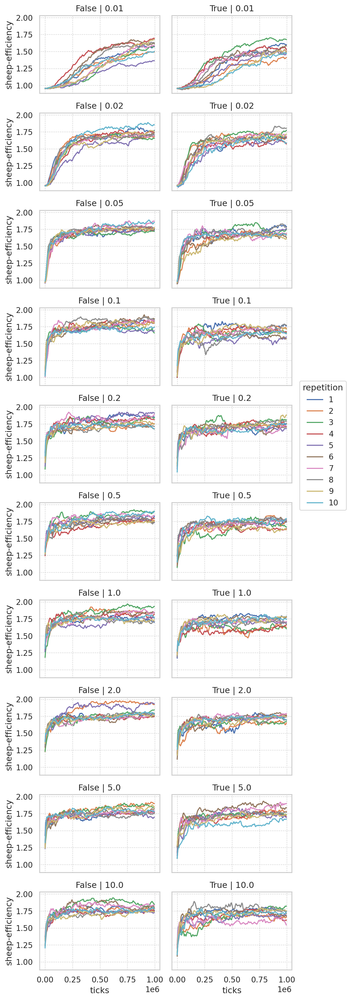

In [59]:
so.Plot(
    sheep_mut_rate_df.groupby_dynamic(
        "ticks",
        every="5000i",
        period="10000i",
        closed="right",
        by=["mut-rate", "crossover?", "repetition"],
    )
    .agg(
        (pl.col("sheep-efficiency") * pl.col("sheep-eat-attempts")).sum()
        / pl.sum("sheep-eat-attempts")
        # pl.mean("sheep-efficiency")
    )
    .to_pandas(),
    x="ticks",
    y="sheep-efficiency",
    color="repetition",
).facet(row="mut-rate", col="crossover?").add(so.Lines()).layout(size=(6, 20)).scale(
    color=so.Nominal()
)


## Sheep mutation rate efficiency

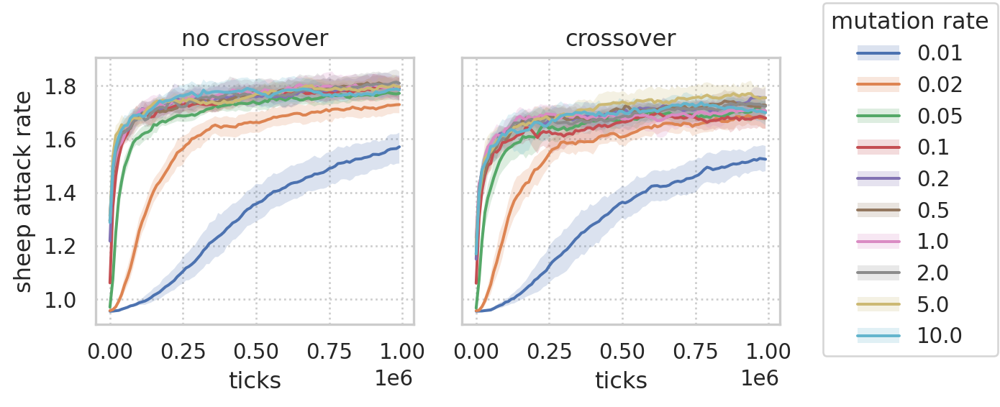

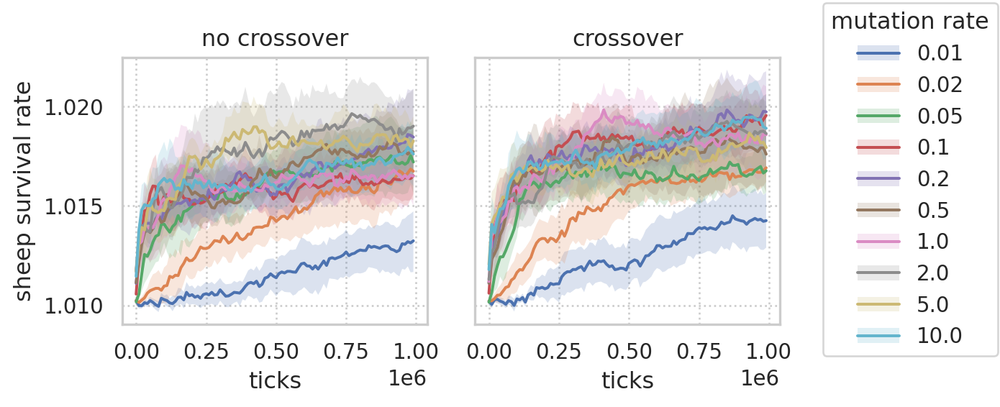

In [6]:
def plot_effs_over_time(
    df: pl.DataFrame, eff: str, eff_bounds: str, color: str, facet: Optional[str] = None
) -> so.Plot:
    p = (
        so.Plot(
            df.with_columns(
                upper=pl.col(eff_bounds).struct.field("upper"),
                lower=pl.col(eff_bounds).struct.field("lower"),
            ).to_pandas(),
            x="ticks",
            y=eff,
            ymin="lower",
            ymax="upper",
            color=color,
        )
        .add(so.Line())
        .add(so.Band())
        .scale(color=so.Nominal(), x=so.Continuous().tick(every=250_000))
        .layout(size=(6, 3))
    )
    if facet:
        p = p.facet(
            col=facet,
        )
    return p


mr_labels = dict(title=crossover_label, color=mr_label)


display(
    plot_effs_over_time(
        sheep_mut_rate_agg_df, "sheep-efficiency", "sheep_eff", *mr_params
    )
    .label(y=sheep_eff_label, **mr_labels)
    .save("images/nn-mr-sheep-eff.png", **save_params)
)
display(
    plot_effs_over_time(
        sheep_mut_rate_agg_df,
        "sheep-escape-efficiency",
        "sheep_esc",
        "mut-rate",
        "crossover?",
    )
    .label(y=sheep_esc_label, **mr_labels)
    .scale(y=so.Continuous().tick(every=0.005))
    .save("images/nn-mr-sheep-esc.png", **save_params)
)


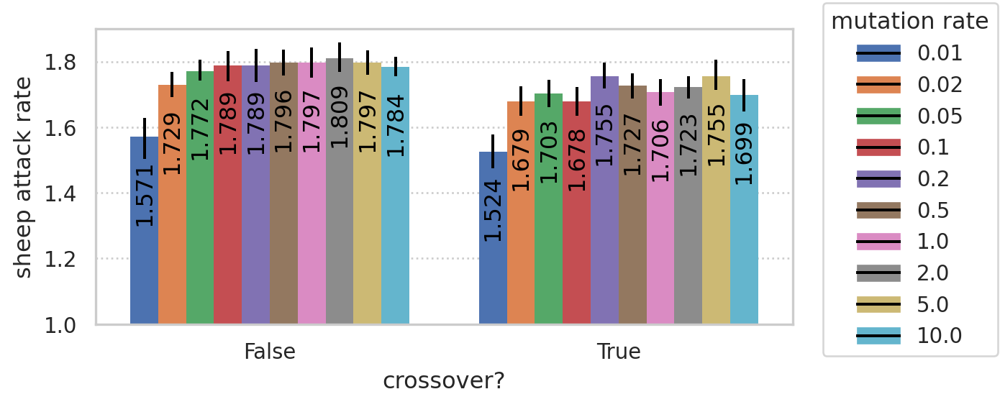

In [7]:
def plot_effs_at_end(
    df: pl.DataFrame,
    eff: str,
    eff_bounds: str,
    color: Optional[str],
    x: Optional[str],
    precision=3,
) -> so.Plot:
    p = (
        so.Plot(
            df.filter(pl.col("ticks") == 990_000)
            .with_columns(
                upper=pl.col(eff_bounds).struct.field("upper"),
                lower=pl.col(eff_bounds).struct.field("lower"),
                label=pl.col(eff).round(precision),
            )
            .to_pandas(),
            x=x,
            y=eff,
            ymin="lower",
            ymax="upper",
            color=color,
            text="label",
        )
        .add(so.Bar(alpha=1), so.Dodge(by=["color"]))
        .add(so.Range(color="black"), so.Dodge(by=["color"]))
        .add(
            so.Text(
                {"rotation": 90},
                valign="top",
                color="black",
                offset=12,
            ),
            so.Dodge(by=["color"]),
        )
        .layout(size=(6, 3))
    )
    if color:
        p = p.scale(
            color=so.Nominal(order=df[color].unique().sort(descending=False).to_list())
        )
    if x:
        p = p.scale(x=so.Nominal(order=df[x].unique().sort(descending=False).to_list()))
    return p


plot_effs_at_end(
    sheep_mut_rate_agg_df, "sheep-efficiency", "sheep_eff", *mr_params
).limit(y=(1, 1.9)).label(y=sheep_eff_label, color="mutation rate").save(
    "images/nn-mr-end-sheep-eff.png", **save_params
)


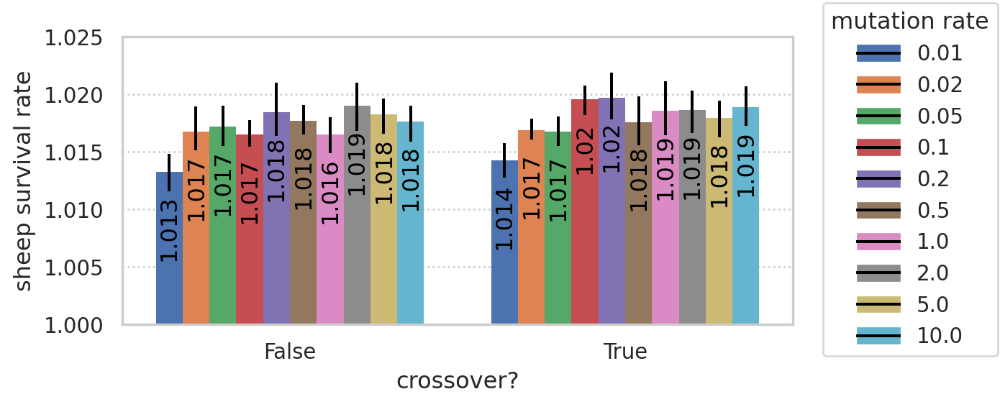

In [8]:
plot_effs_at_end(
    sheep_mut_rate_agg_df, "sheep-escape-efficiency", "sheep_esc", *mr_params
).limit(y=(1, 1.025)).label(y=sheep_esc_label, color="mutation rate").save(
    "images/nn-mr-end-sheep-esc.png", **save_params
)


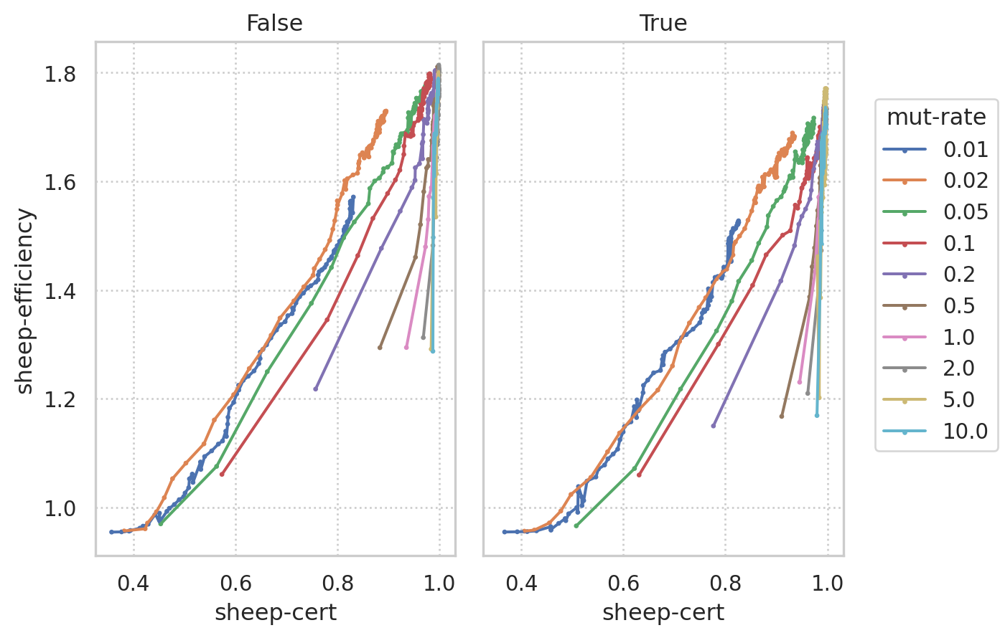

In [9]:
(
    so.Plot(
        sheep_mut_rate_agg_df.to_pandas(),
        # x="ticks",
        x="sheep-cert",
        # y="sheep-cert",
        y="sheep-efficiency",
        color="mut-rate",
    )
    .facet(col="crossover?")
    .add(so.Dot(pointsize=2))
    # .add(so.Line(), so.PolyFit(2))
    # .add(so.Path())
    .add(so.Line())
    .scale(color=so.Nominal())
)


## Sheep mutation rate population


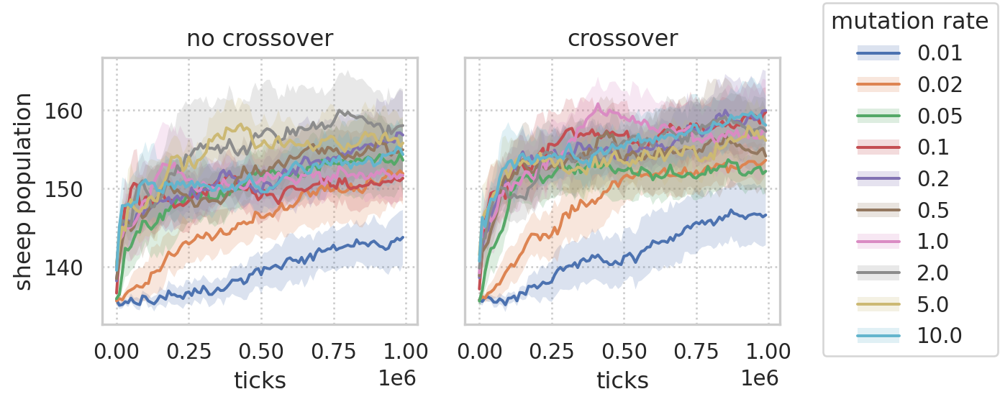

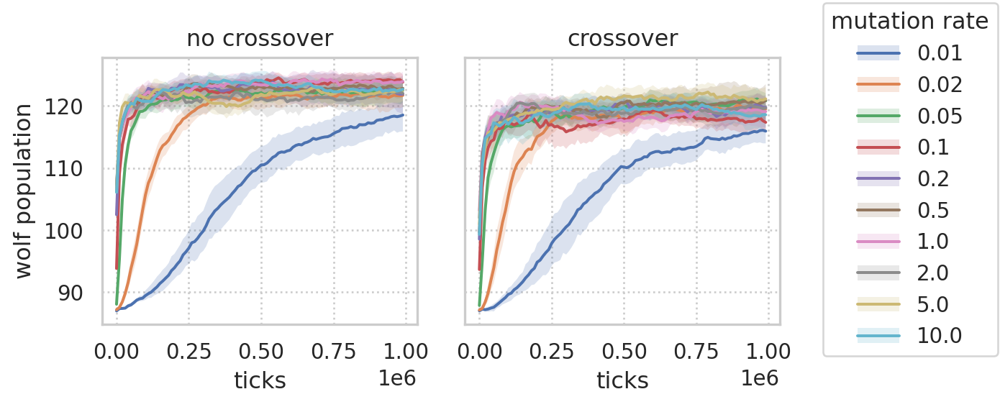

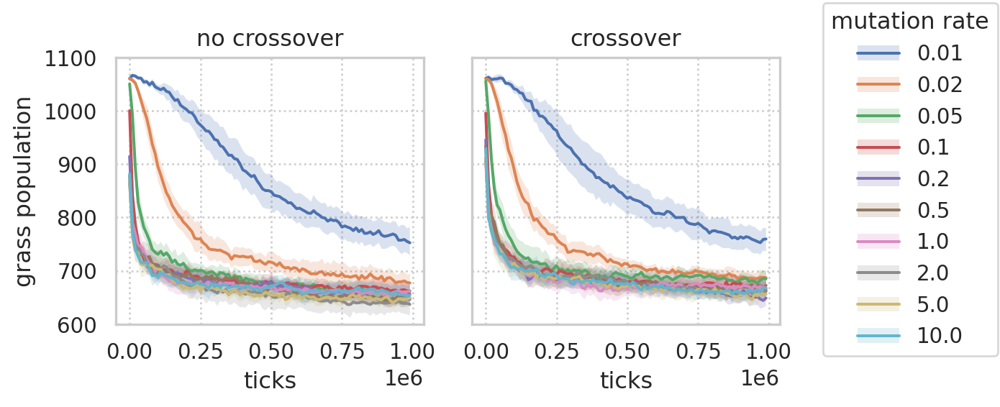

In [10]:
display(
    plot_effs_over_time(
        sheep_mut_rate_agg_df, "num_sheep", "num_sheep_range", *mr_params
    )
    .label(y=num_sheep_label, **mr_labels)
    .save("images/nn-mr-sheep-sheep-pop.png", **save_params)
)
display(
    plot_effs_over_time(
        sheep_mut_rate_agg_df, "num_wolves", "num_wolves_range", *mr_params
    )
    .label(y=num_wolves_label, **mr_labels)
    .save("images/nn-mr-sheep-wolf-pop.png", **save_params)
)
display(
    plot_effs_over_time(
        sheep_mut_rate_agg_df, "num_grass", "num_grass_range", *mr_params
    )
    .label(y=num_grass_label, **mr_labels)
    .limit(y=(600, 1100))
    .save("images/nn-mr-sheep-grass-pop.png", **save_params)
)


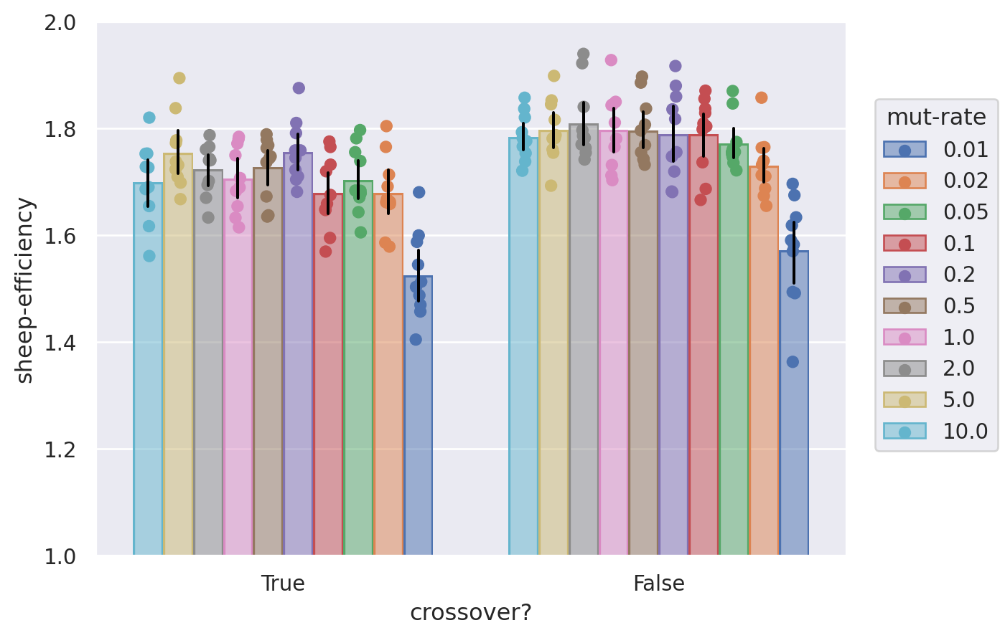

In [79]:
so.Plot(
    sheep_mut_rate_smoothed_df.filter(pl.col("ticks") == 990_000).to_pandas(),
    x="crossover?",
    color="mut-rate",
    y="sheep-efficiency",
).add(so.Bar(alpha=0.5), so.Agg(), so.Dodge()).add(
    so.Dot(), so.Dodge(), so.Jitter()
).add(
    so.Range(color="black"), so.Est(), so.Dodge()
).scale(
    color=so.Nominal()
).limit(
    y=(1, 2)
)


# Wolf mutation rate

In [11]:
wolf_mut_rate_df = parqify_results(
    glob("data/2023-06-29_wolf-mut-rate-1M-by-100/*.csv"),
    "data/2023-06-29_wolf-mut-rate-1M-by-100",
    csv_kwargs=dict(dtypes=dtypes),
).with_columns(repetition(mr_params))

wolf_mut_rate_smoothed_effs = smooth_effs(wolf_mut_rate_df, [*mr_params, "repetition"])
wolf_mut_rate_agg_effs = agg_smoothed_effs(
    wolf_mut_rate_smoothed_effs, [*mr_params, "ticks"]
)


The predicate 'col("sheep-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("wolf-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("sheep-escape-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change


## Wolf mutation rate efficiency

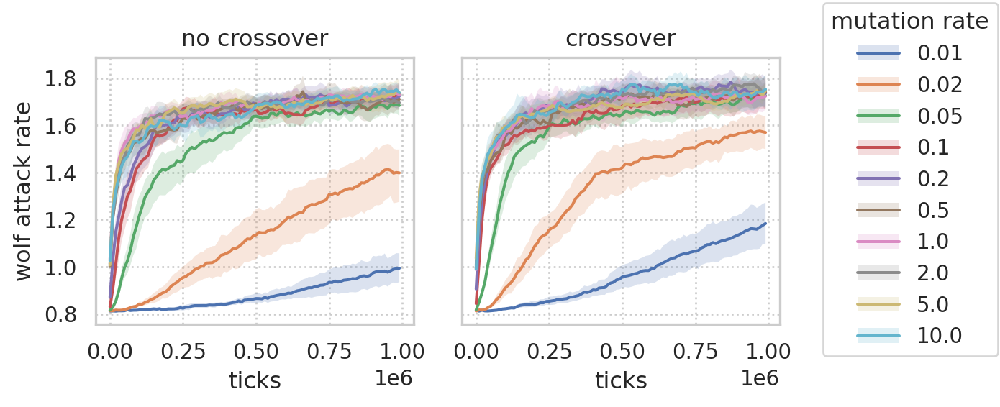

In [12]:
plot_effs_over_time(
    wolf_mut_rate_agg_effs, "wolf-efficiency", "wolf_eff", *mr_params
).label(y=wolf_eff_label, **mr_labels).save("images/nn-mr-wolf-eff.png", **save_params)


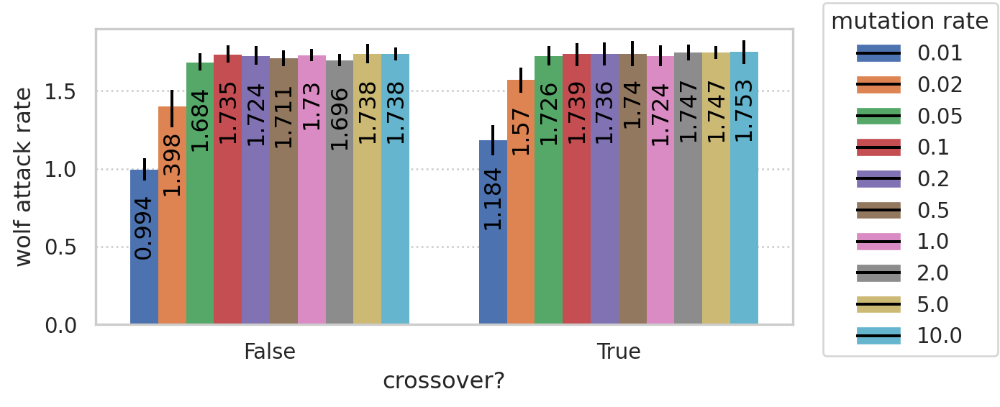

In [13]:
plot_effs_at_end(
    wolf_mut_rate_agg_effs, "wolf-efficiency", "wolf_eff", *mr_params
).limit(y=(0.0, 1.9)).label(y=wolf_eff_label, color=mr_label).save(
    "images/nn-mr-end-wolf-eff.png", **save_params
)


## Wolf mutation rate population

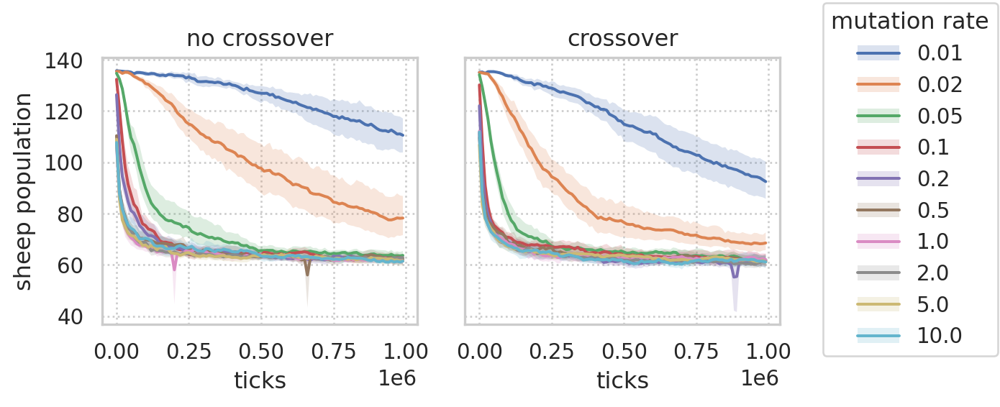

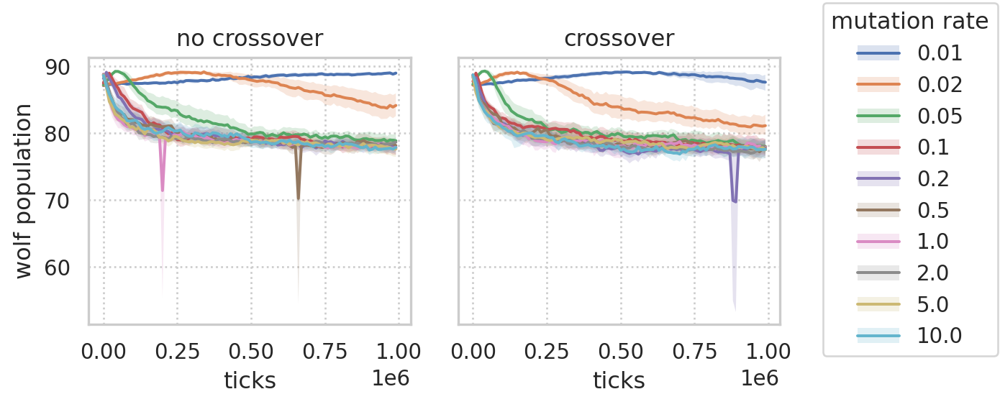

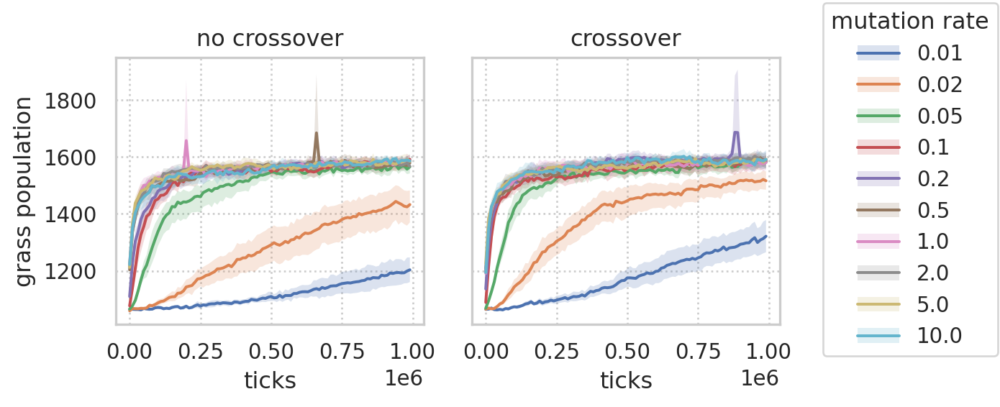

In [14]:
display(
    plot_effs_over_time(
        wolf_mut_rate_agg_effs, "num_sheep", "num_sheep_range", *mr_params
    )
    .label(y="sheep population", **mr_labels)
    .save("images/nn-mr-wolf-sheep-pop.png", **save_params)
)
display(
    plot_effs_over_time(
        wolf_mut_rate_agg_effs, "num_wolves", "num_wolves_range", *mr_params
    )
    .label(y="wolf population", **mr_labels)
    .save("images/nn-mr-wolf-wolf-pop.png", **save_params)
)
display(
    plot_effs_over_time(
        wolf_mut_rate_agg_effs, "num_grass", "num_grass_range", *mr_params
    )
    .label(y="grass population", **mr_labels)
    .save("images/nn-mr-wolf-grass-pop.png", **save_params)
)


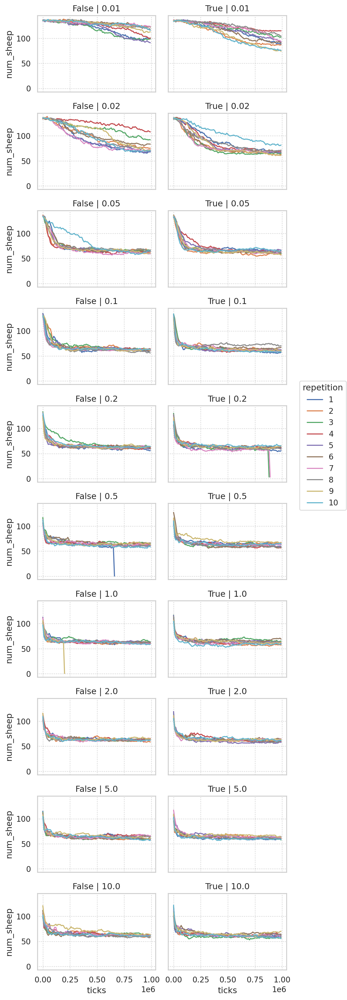

In [87]:
(
    so.Plot(
        wolf_mut_rate_smoothed_effs.to_pandas(),
        x="ticks",
        y="num_sheep",
        color="repetition",
    )
    .facet(col="crossover?", row="mut-rate")
    .layout(size=(6, 20))
    .add(so.Line())
    .scale(color=so.Nominal())
)


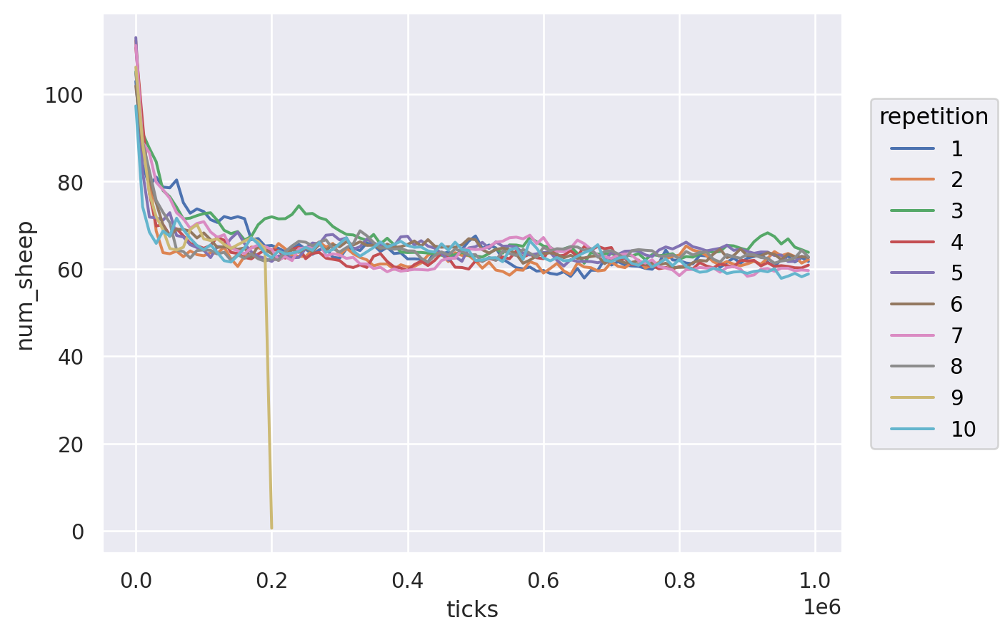

In [74]:
so.Plot(
    # wolf_mut_rate_df.filter(
    #     (pl.col("mut-rate") == 1.0) & (pl.col("crossover?") == False)
    # )
    # .with_columns(num_sheep=pl.col("sheep-eat-attempts") / 100)
    # .to_pandas(),
    wolf_mut_rate_smoothed_effs.filter(
        (pl.col("mut-rate") == 1.0) & (pl.col("crossover?") == False)
    ).to_pandas(),
    x="ticks",
    y="num_sheep",
    color="repetition",
).add(so.Line()).scale(color=so.Nominal())


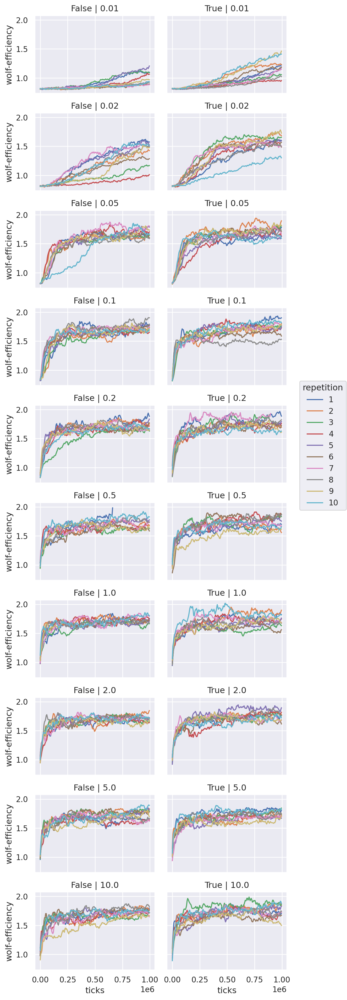

In [107]:
so.Plot(
    wolf_mut_rate_smoothed_effs.to_pandas(),
    x="ticks",
    y="wolf-efficiency",
    color="repetition",
).facet(row="mut-rate", col="crossover?").add(so.Lines()).layout(size=(6, 20)).scale(
    color=so.Nominal()
)


# Sheep FOV

In [15]:
fov_params = ("fov", "granularity")

sheep_fov_df = parqify_results(
    glob("data/2023-07-01_sheep-fov-1M-by-100/*.csv"),
    "data/2023-07-01_sheep-fov-1M-by-100",
    csv_kwargs=dict(dtypes=dtypes),
).with_columns(repetition(fov_params))

sheep_fov_smoothed_effs_df = smooth_effs(sheep_fov_df, [*fov_params, "repetition"])
sheep_fov_agg_df = agg_smoothed_effs(sheep_fov_smoothed_effs_df, [*fov_params, "ticks"])


The predicate 'col("sheep-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("wolf-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("sheep-escape-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change


## Sheep FOV efficiency

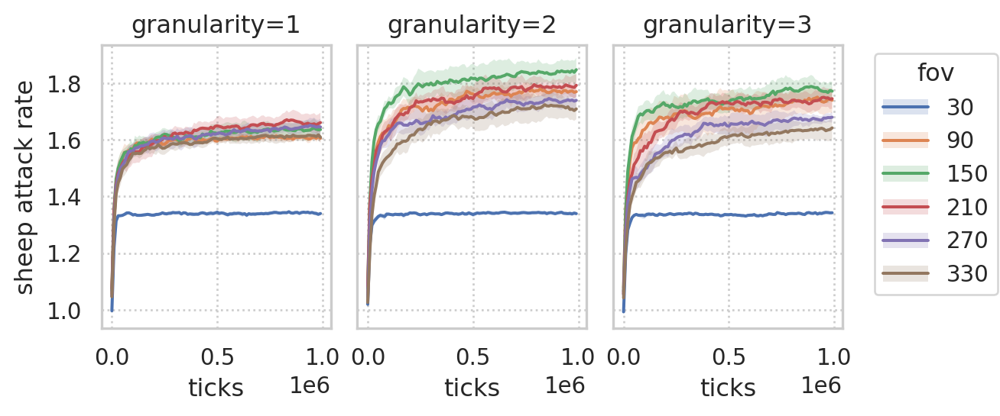

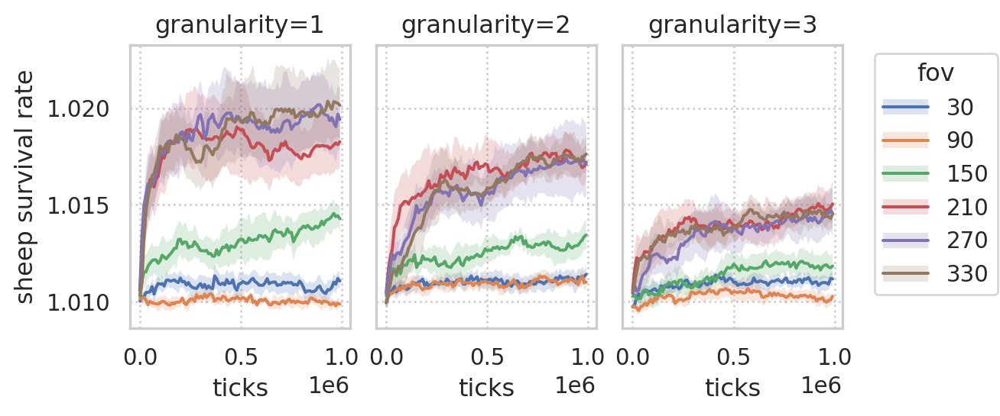

In [16]:
gran_label = "granularity={}".format

display(
    plot_effs_over_time(sheep_fov_agg_df, "sheep-efficiency", "sheep_eff", *fov_params)
    .scale(x=so.Continuous())
    .label(y=sheep_eff_label, title=gran_label)
    .save("images/nn-fov-sheep-eff.png", **save_params)
)
display(
    plot_effs_over_time(
        sheep_fov_agg_df, "sheep-escape-efficiency", "sheep_esc", *fov_params
    )
    .scale(x=so.Continuous(), y=so.Continuous().tick(every=0.005))
    .label(y=sheep_esc_label, title=gran_label)
    .save("images/nn-fov-sheep-esc.png", **save_params)
)


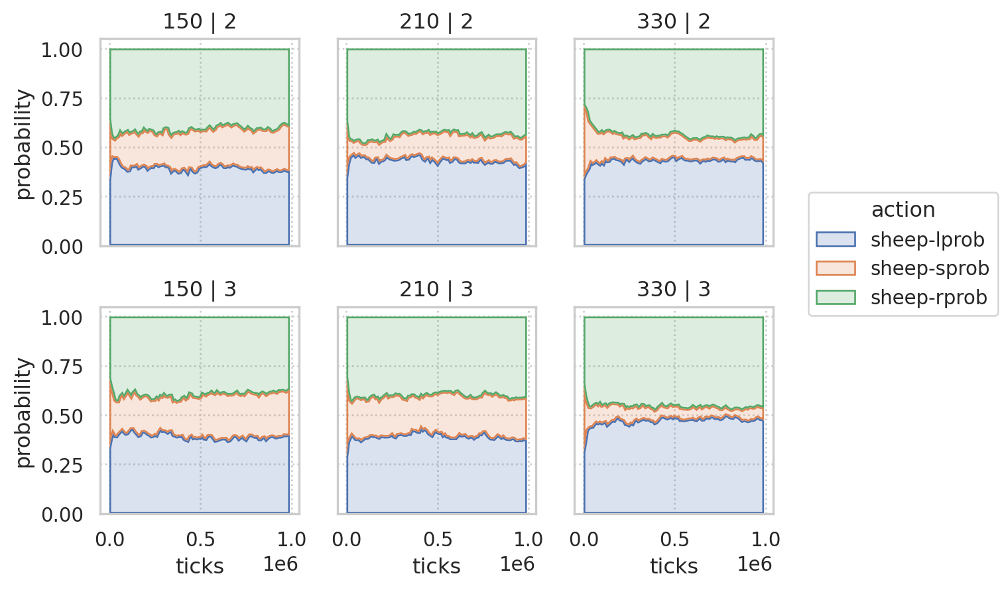

In [188]:
(
    sheep_fov_agg_df.filter(
        (pl.col("granularity").is_in([2, 3])) & (pl.col("fov").is_in([150, 210, 330]))
    )
    .melt(
        ["ticks", "fov", "granularity"],
        ["sheep-lprob", "sheep-sprob", "sheep-rprob"],
        "action",
        "probability",
    )
    .to_pandas()
    .pipe(
        so.Plot,
        x="ticks",
        y="probability",
        color="action",
    )
    .facet(col="fov", row="granularity")
    .add(so.Area(), so.Stack())
)


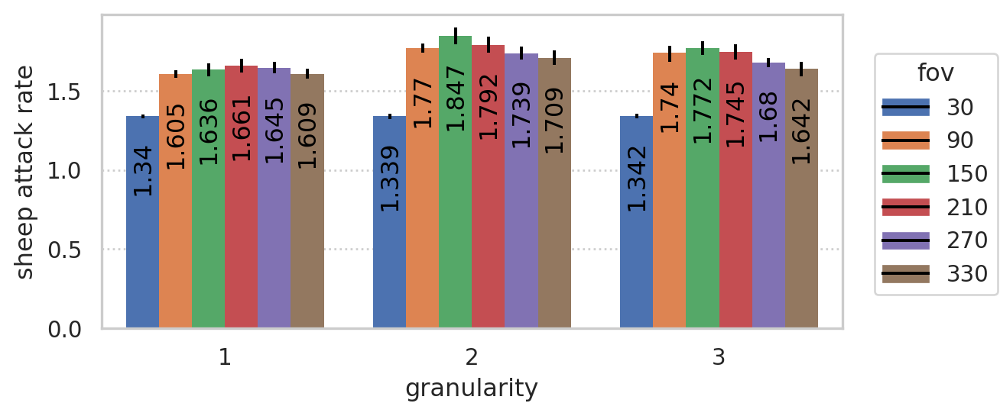

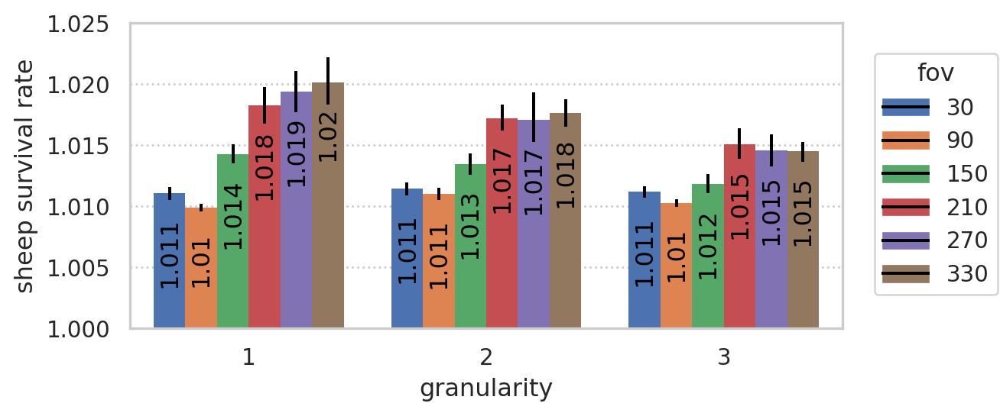

In [17]:
display(
    plot_effs_at_end(sheep_fov_agg_df, "sheep-efficiency", "sheep_eff", *fov_params)
    .label(y=sheep_eff_label)
    .save("images/nn-fov-end-sheep-eff.png", **save_params)
)
display(
    plot_effs_at_end(
        sheep_fov_agg_df, "sheep-escape-efficiency", "sheep_esc", *fov_params
    )
    .limit(y=(1.0, 1.025))
    .label(y=sheep_esc_label)
    .save("images/nn-fov-end-sheep-esc.png", **save_params)
)


## Sheep FOV population

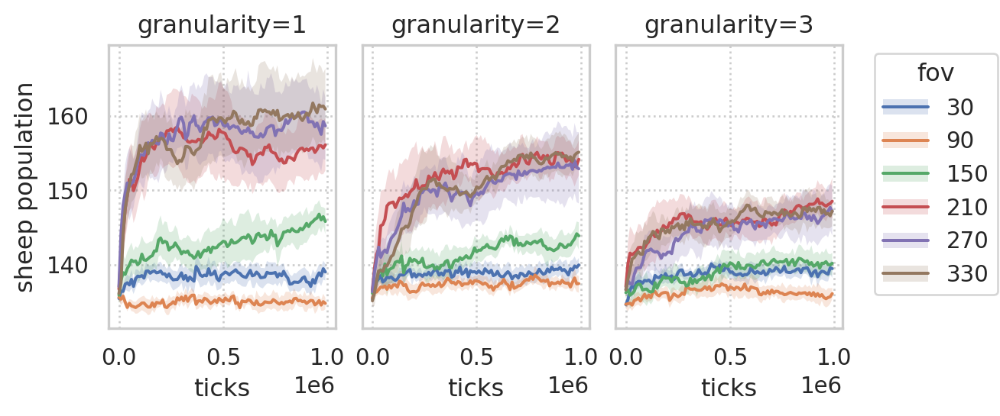

In [18]:
(
    plot_effs_over_time(
        sheep_fov_agg_df, "num_sheep", "num_sheep_range", "fov", "granularity"
    )
    .label(y="sheep population", title=gran_label)
    .scale(x=so.Continuous())
    .save("images/nn-fov-sheep-sheep-pop.png")
)


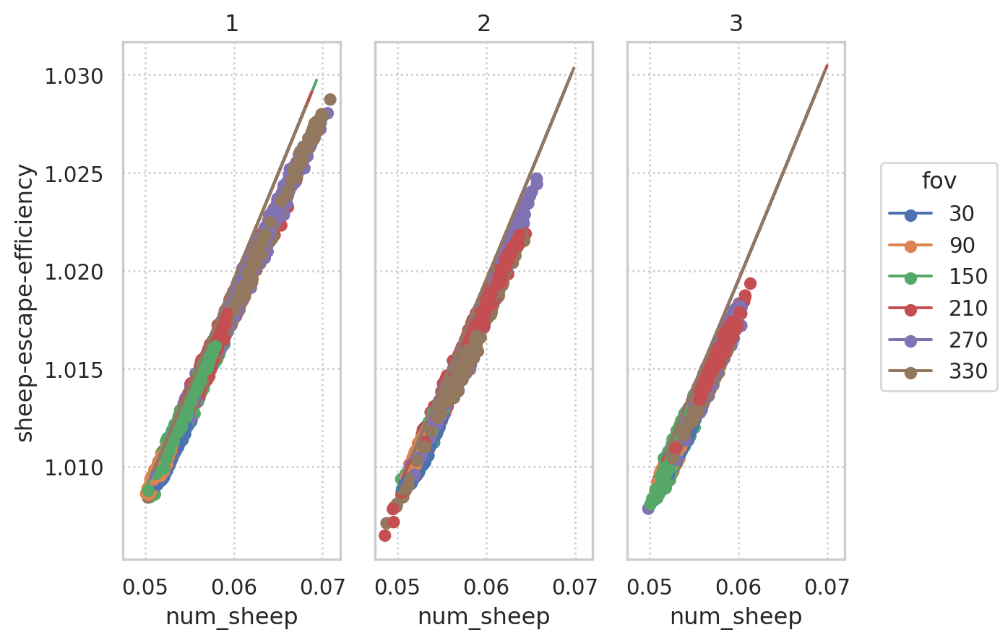

In [27]:
(
    sheep_fov_smoothed_effs_df.with_columns(pl.col("num_sheep") / 2601)
    .to_pandas()
    .pipe(so.Plot, y="sheep-escape-efficiency", x="num_sheep", color="fov")
    .add(so.Dot())
    .facet(col="granularity")
    .scale(color=so.Nominal())
    .add(
        so.Line(),
        x=np.linspace(0.05, 0.07, 18000),
        y=(1 - 5 / 120) / (1 - np.linspace(0.05, 0.07, 18000)),
    )
)


# Wolf FOV

In [19]:
wolf_fov_df = parqify_results(
    glob("data/2023-07-01_wolf-fov-1M-by-100/*.csv"),
    "data/2023-07-01_wolf-fov-1M-by-100",
    csv_kwargs=dict(dtypes=dtypes),
).with_columns(repetition(fov_params))

wolf_fov_smoothed_effs = smooth_effs(wolf_fov_df, [*fov_params, "repetition"])
wolf_fov_agg_effs = agg_smoothed_effs(wolf_fov_smoothed_effs, [*fov_params, "ticks"])


The predicate 'col("sheep-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("wolf-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("sheep-escape-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change


## Wolf FOV efficiency

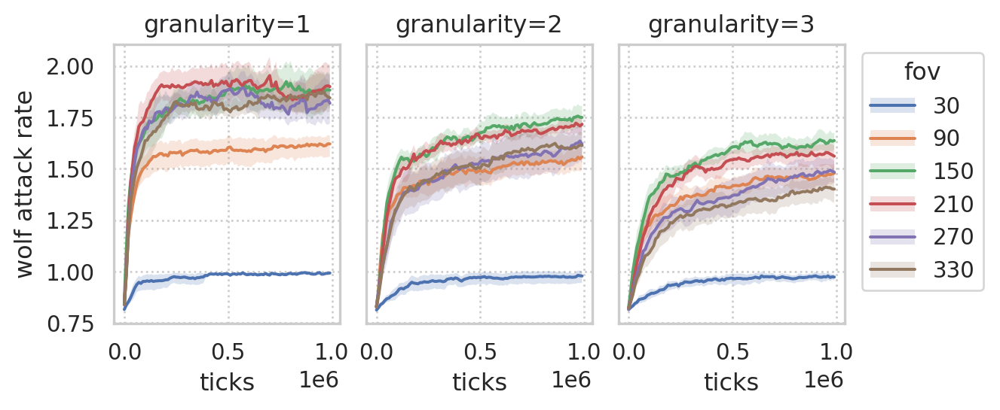

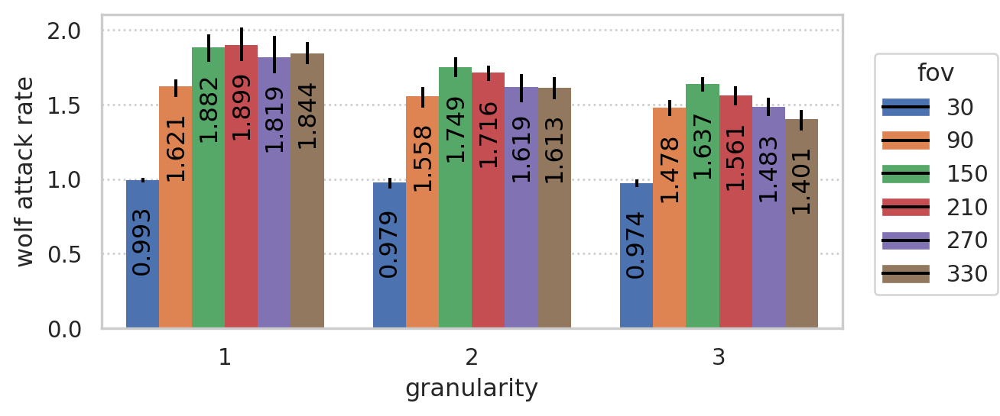

In [20]:
display(
    plot_effs_over_time(wolf_fov_agg_effs, "wolf-efficiency", "wolf_eff", *fov_params)
    .scale(x=so.Continuous())
    .label(y=wolf_eff_label, title=gran_label)
    .save("images/nn-fov-wolf-eff.png", **save_params)
)
display(
    plot_effs_at_end(wolf_fov_agg_effs, "wolf-efficiency", "wolf_eff", *fov_params)
    .label(y=wolf_eff_label)
    .save("images/nn-fov-end-wolf-eff.png", **save_params)
)


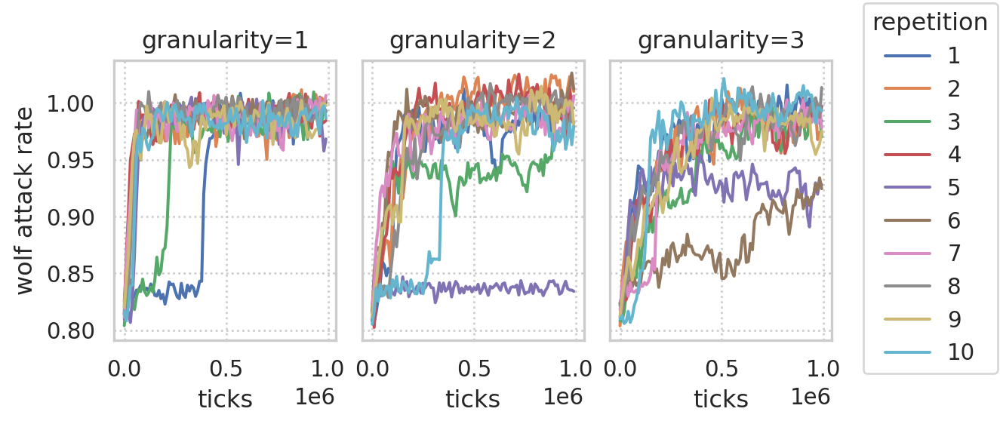

In [21]:
(
    so.Plot(
        wolf_fov_smoothed_effs.filter(pl.col("fov") == 30).to_pandas(),
        x="ticks",
        y="wolf-efficiency",
        color="repetition",
    )
    .facet(col="granularity")
    .add(so.Line())
    .layout(size=(6, 3))
    .scale(color=so.Nominal())
    .layout(size=(6, 3))
    .label(y=wolf_eff_label, title=gran_label)
    .save("images/nn-fov-wolf-eff-rep-compare.png", **save_params)
)


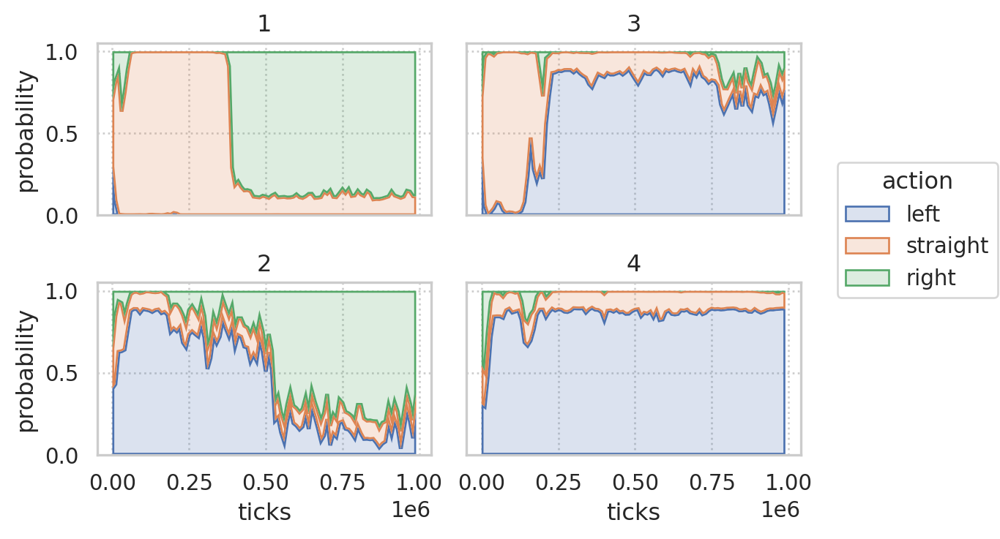

In [22]:
(
    so.Plot(
        wolf_fov_smoothed_effs.filter(
            (pl.col("fov") == 30)
            & (pl.col("repetition").is_in([1, 2, 3, 4]))
            & (pl.col("granularity") == 1)
        )
        .melt(
            ["fov", "repetition", "ticks"],
            ["wolf-lprob", "wolf-sprob", "wolf-rprob"],
            "action",
            "probability",
        )
        .with_columns(
            pl.col("action").map_dict(
                {"wolf-lprob": "left", "wolf-sprob": "straight", "wolf-rprob": "right"}
            )
        )
        .to_pandas(),
        x="ticks",
        y="probability",
        color="action",
    )
    .facet(row="repetition", wrap=2)
    .add(so.Area(), so.Stack())
    .layout(size=(6, 4))
    .save("images/nn-fov-wolf-prob-rep-compare.png", **save_params)
)


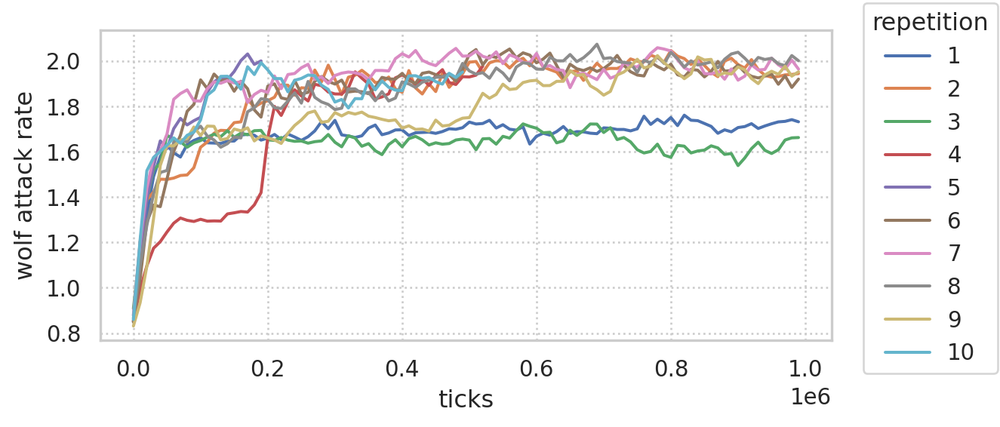

In [37]:
display(
    wolf_fov_smoothed_effs.filter((pl.col("fov") == 150) & (pl.col("granularity") == 1))
    .to_pandas()
    .pipe(
        so.Plot,
        x="ticks",
        y="wolf-efficiency",
        color="repetition",
    )
    .add(so.Line())
    .scale(color=so.Nominal())
    .layout(size=(6, 3))
    .label(y=wolf_eff_label)
    .save("images/nn-fov-wolf-rep-effs-150-1.png", **save_params)
)


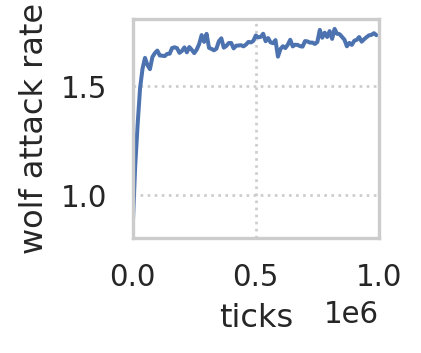

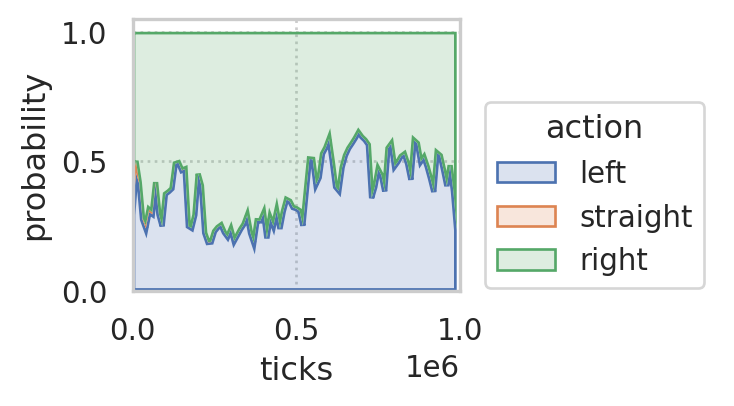

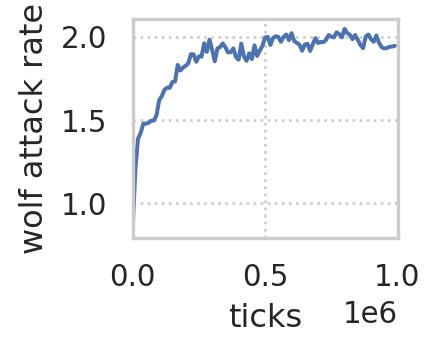

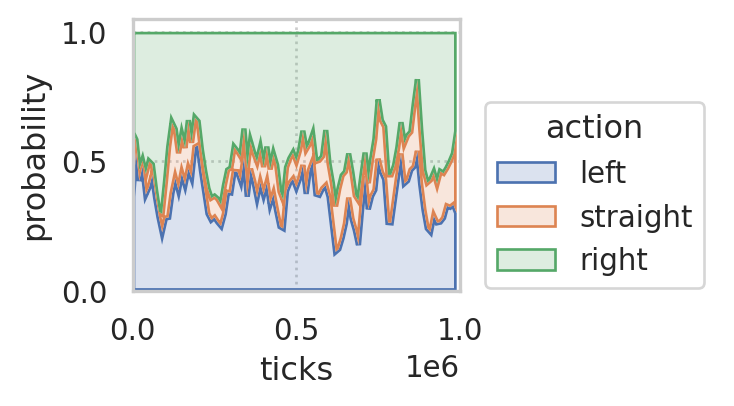

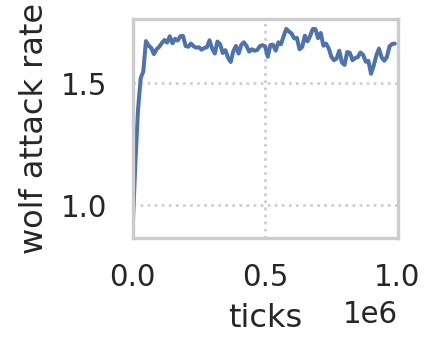

...

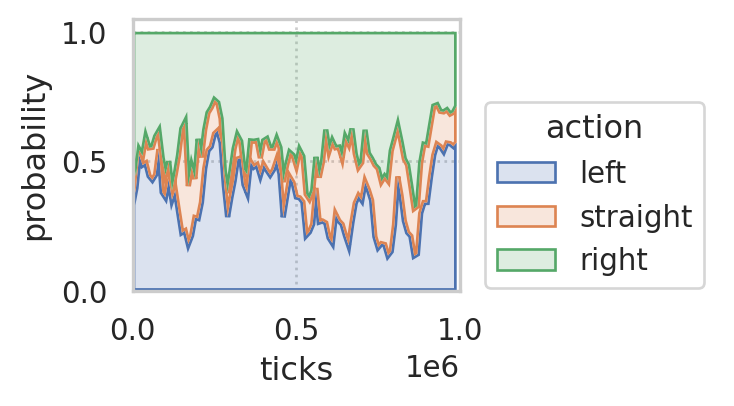

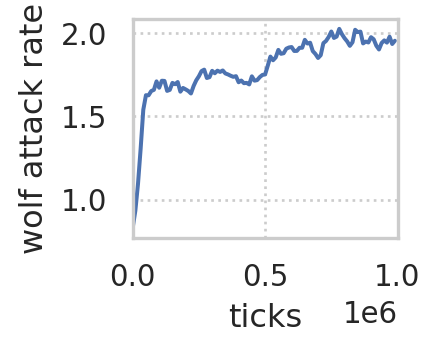

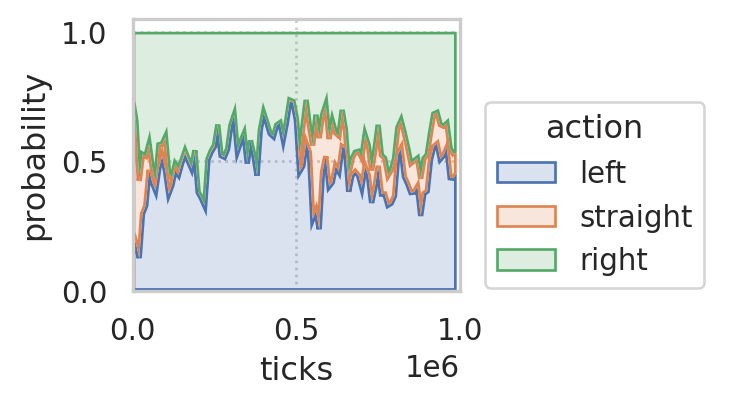

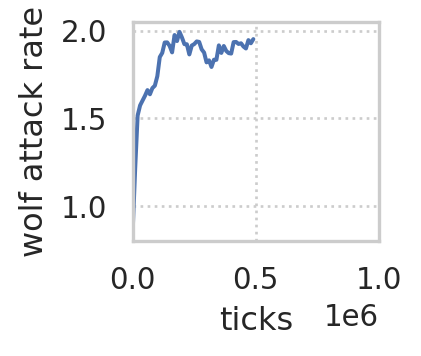

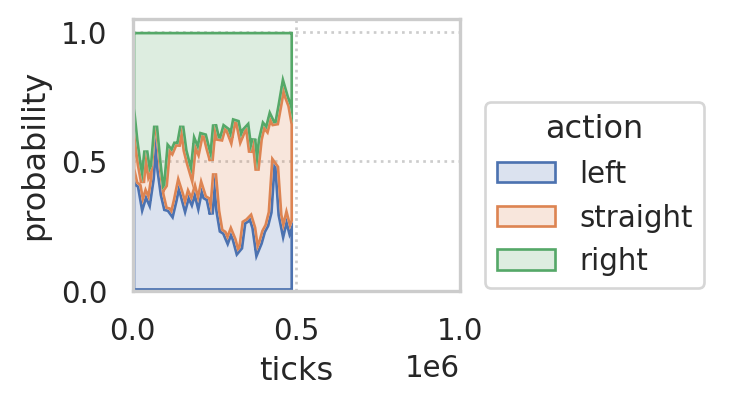

In [41]:
for rep in range(1, 11):
    rep_df = wolf_fov_smoothed_effs.filter(
        (pl.col("granularity") == 1)
        & (pl.col("fov") == 150)
        & (pl.col("repetition") == rep)
    )
    display(
        rep_df.to_pandas()
        .pipe(
            so.Plot,
            x="ticks",
        )
        .add(so.Line(), y="wolf-efficiency")
        .layout(size=(2.5, 2))
        .limit(x=(0, 1_000_000))
        .label(y=wolf_eff_label)
        .save(f"images/nn-fov-wolf-eff-150-1-rep-{rep}.png", **save_params)
    )
    display(
        rep_df.rename(
            {"wolf-lprob": "left", "wolf-sprob": "straight", "wolf-rprob": "right"}
        )
        .melt(
            id_vars="ticks",
            value_vars=["left", "straight", "right"],
            value_name="probability",
            variable_name="action",
        )
        .to_pandas()
        .pipe(
            so.Plot,
            x="ticks",
            y="probability",
            color="action",
        )
        .add(so.Area(), so.Stack())
        .layout(size=(2.5, 2), engine="constrained")
        .limit(x=(0, 1_000_000))
        .save(f"images/nn-fov-wolf-probs-150-1-rep-{rep}.png", **save_params)
    )


## Wolf FOV population

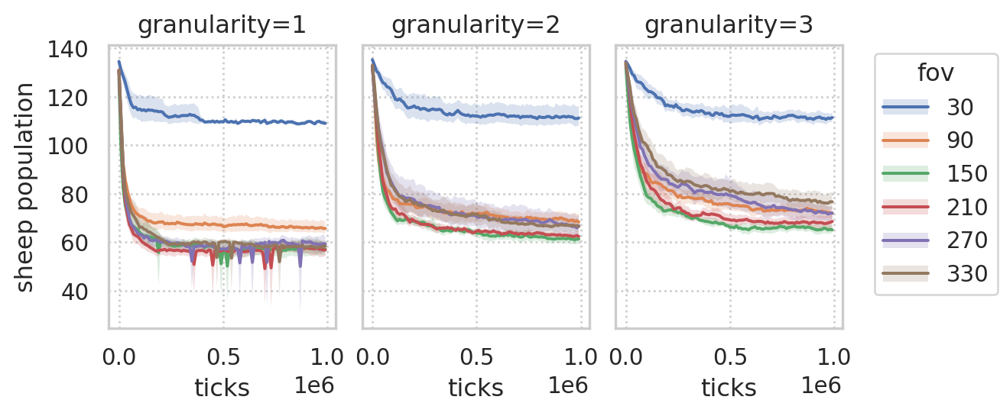

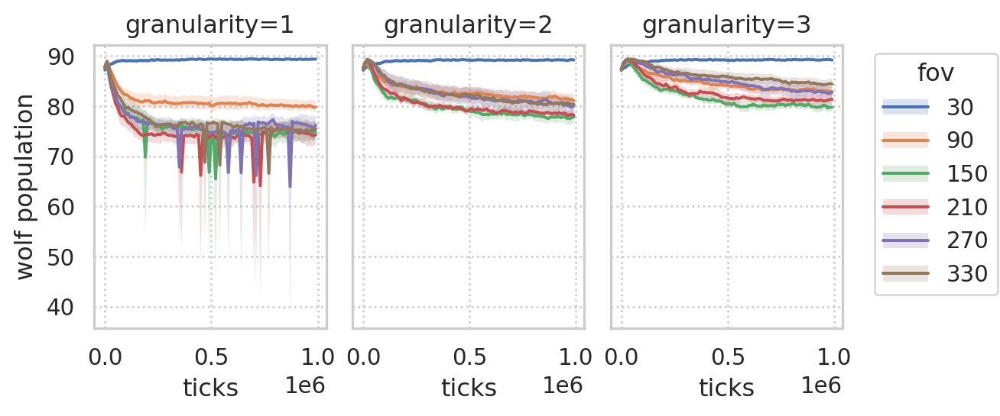

In [46]:
display(
    plot_effs_over_time(
        wolf_fov_agg_effs, "num_sheep", "num_sheep_range", "fov", "granularity"
    )
    .scale(x=so.Continuous())
    .label(y="sheep population", title=gran_label)
    .save("images/nn-fov-wolf-sheep-pop.png", **save_params)
)
display(
    plot_effs_over_time(
        wolf_fov_agg_effs, "num_wolves", "num_wolves_range", "fov", "granularity"
    )
    .scale(x=so.Continuous())
    .label(y="wolf population", title=gran_label)
    .save("images/nn-fov-wolf-wolf-pop.png", **save_params)
)


# Sheep perception

In [42]:
def species_sees(species: str) -> pl.Expr:
    return (
        sum(
            (
                pl.when(pl.col(f"{species}-see-{agents}?"))
                .then(agents[0])
                .otherwise("")
                for agents in ["sheep", "wolves", "grass"]
            ),
            pl.lit(""),
        )
        .alias(f"{species}-see")
        .str.replace("^$", "none")
    )


perc_params = ["sheep-see", "wolves-see"]


sheep_perc_df = (
    parqify_results(
        glob("data/2023-07-05_sheep-perception-1M-by-100/*.csv"),
        "data/2023-07-05_sheep_perception-1M-by-100",
    )
    .with_columns(species_sees("sheep"), species_sees("wolves"))
    .with_columns(repetition(perc_params))
)
sheep_perc_smoothed_effs_df = smooth_effs(sheep_perc_df, [*perc_params, "repetition"])
sheep_perc_agg_df = agg_smoothed_effs(
    sheep_perc_smoothed_effs_df, [*perc_params, "ticks"]
)


The predicate 'col("sheep-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("wolf-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("sheep-escape-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change


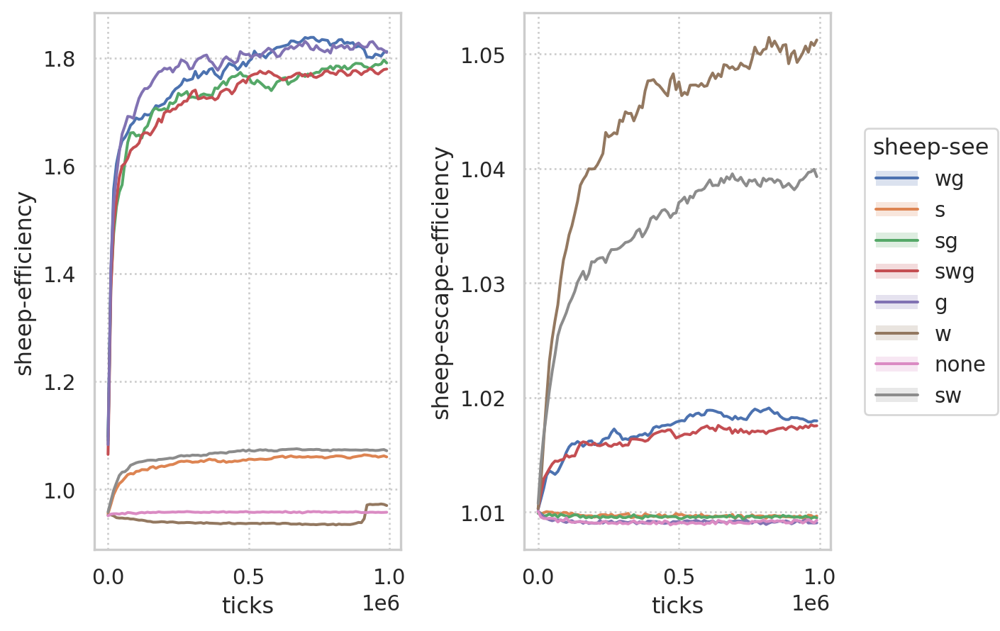

In [45]:
display(
    sheep_perc_agg_df.to_pandas()
    .pipe(
        so.Plot,
        color="sheep-see",
    )
    .pair(
        x=["ticks", "ticks"],
        y=["sheep-efficiency", "sheep-escape-efficiency"],
        cross=False,
    )
    .add(so.Line())
)


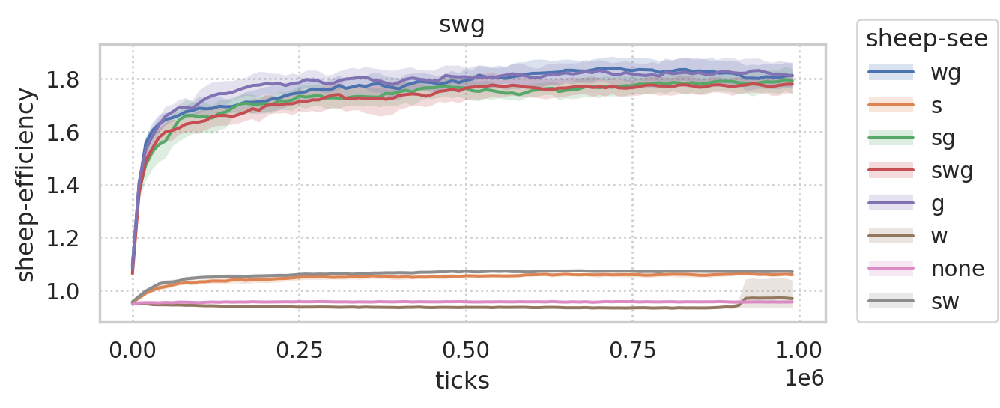

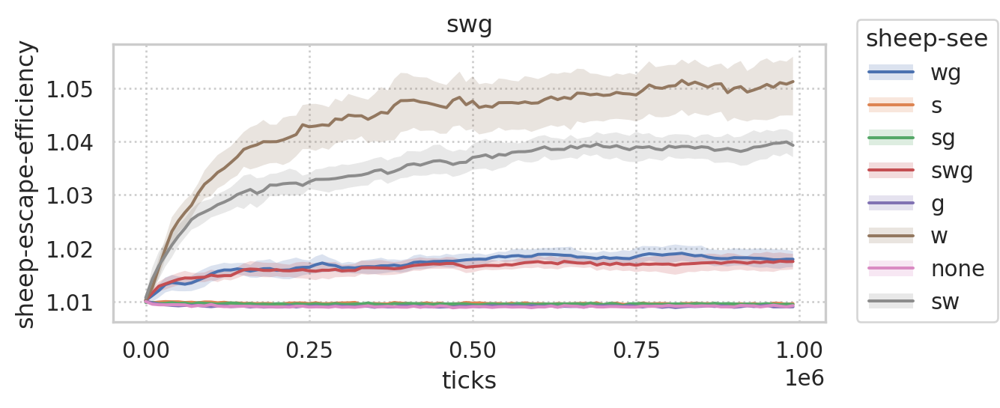

In [52]:
display(
    plot_effs_over_time(
        sheep_perc_agg_df, "sheep-efficiency", "sheep_eff", "sheep-see", "wolves-see"
    )
)
display(
    plot_effs_over_time(
        sheep_perc_agg_df,
        "sheep-escape-efficiency",
        "sheep_esc",
        "sheep-see",
        "wolves-see",
    )
)


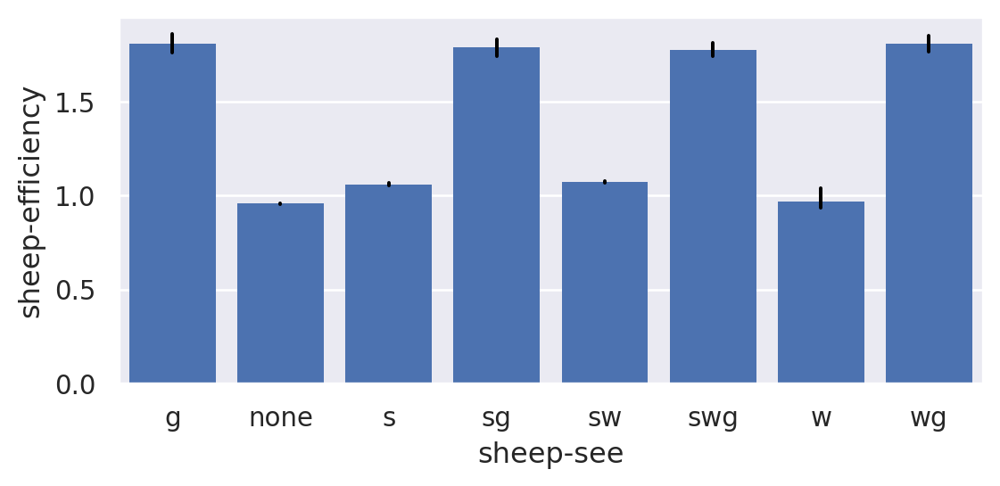

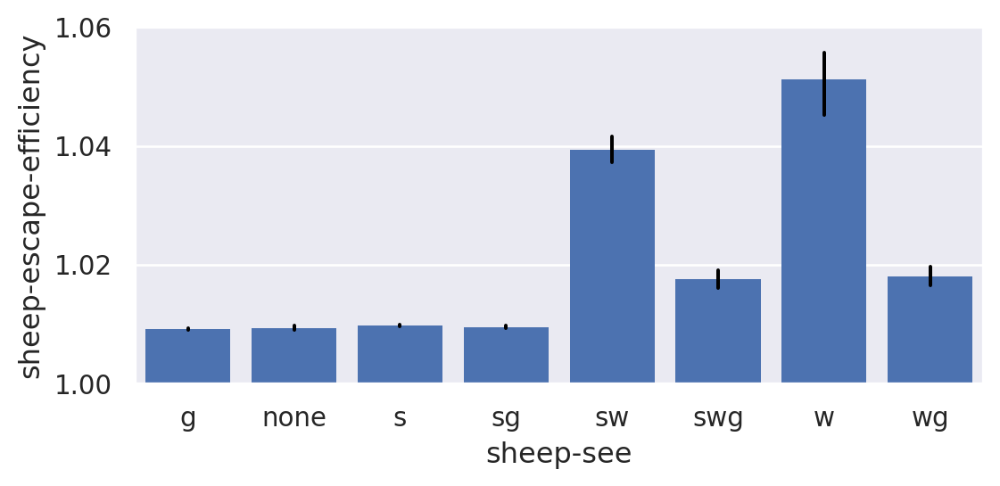

In [132]:
display(
    plot_effs_at_end(
        sheep_perc_agg_df, "sheep-efficiency", "sheep_eff", None, "sheep-see"
    )
)
plot_effs_at_end(
    sheep_perc_agg_df, "sheep-escape-efficiency", "sheep_esc", None, "sheep-see"
).limit(y=(1.0, 1.06))


In [134]:
wolf_perc_df = (
    parqify_results(
        glob("data/2023-07-05_wolf-perception-1M-by-100/*.csv"),
        "data/2023-07-05_wolf-perception-1M-by-100",
    )
    .with_columns(species_sees("sheep"), species_sees("wolves"))
    .with_columns(repetition(perc_params))
)

wolf_perc_smoothed_effs_df = smooth_effs(wolf_perc_df, [*perc_params, "repetition"])
wolf_perc_agg_df = agg_smoothed_effs(
    wolf_perc_smoothed_effs_df, [*perc_params, "ticks"]
)


The predicate 'col("sheep-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("sheep-escape-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("wolf-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change


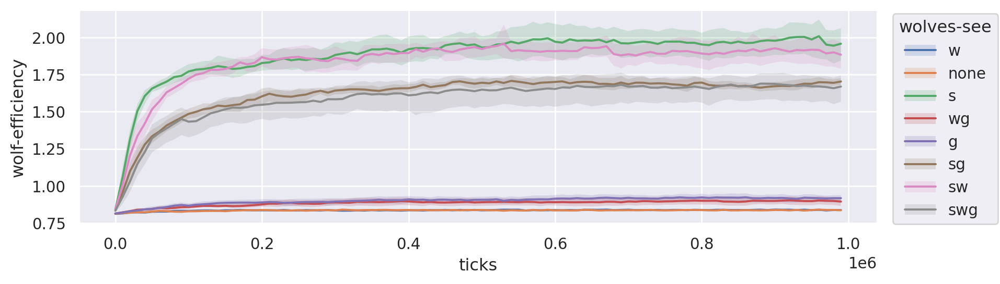

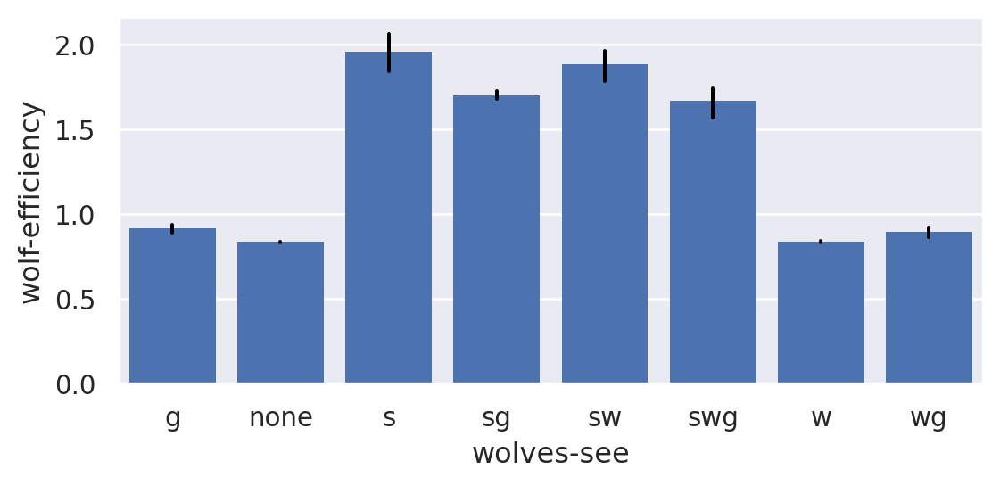

In [136]:
display(
    plot_effs_over_time(wolf_perc_agg_df, "wolf-efficiency", "wolf_eff", "wolves-see")
)
display(
    plot_effs_at_end(
        wolf_perc_agg_df, "wolf-efficiency", "wolf_eff", None, "wolves-see"
    )
)


In [137]:
both_perc_df = (
    parqify_results(
        glob("data/2023-07-05_coevolution-perception-1M-by-100/*.csv"),
        "data/2023-07-05_coevolution-perception-1M-by-100",
    )
    .with_columns(species_sees("sheep"), species_sees("wolves"))
    .with_columns(repetition(perc_params))
)

both_perc_smoothed_effs_df = smooth_effs(both_perc_df, [*perc_params, "repetition"])
both_perc_agg_df = agg_smoothed_effs(
    both_perc_smoothed_effs_df, [*perc_params, "ticks"]
)


Got No such file or directory: data/2023-07-05_coevolution-perception-1M-by-100.parquet; reading CSVs:
	data/2023-07-05_coevolution-perception-1M-by-100/00.csv
	data/2023-07-05_coevolution-perception-1M-by-100/01.csv
	data/2023-07-05_coevolution-perception-1M-by-100/02.csv
	data/2023-07-05_coevolution-perception-1M-by-100/03.csv
	data/2023-07-05_coevolution-perception-1M-by-100/04.csv
	data/2023-07-05_coevolution-perception-1M-by-100/05.csv
	data/2023-07-05_coevolution-perception-1M-by-100/06.csv
	data/2023-07-05_coevolution-perception-1M-by-100/07.csv
	data/2023-07-05_coevolution-perception-1M-by-100/08.csv
	data/2023-07-05_coevolution-perception-1M-by-100/09.csv
Reading data/2023-07-05_coevolution-perception-1M-by-100/00.csv
Reading data/2023-07-05_coevolution-perception-1M-by-100/01.csv
Reading data/2023-07-05_coevolution-perception-1M-by-100/02.csv
Reading data/2023-07-05_coevolution-perception-1M-by-100/03.csv
Reading data/2023-07-05_coevolution-perception-1M-by-100/04.csv
Reading

The predicate 'col("sheep-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("sheep-escape-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change
The predicate 'col("wolf-efficiency").is_not_nan()' in 'when->then->otherwise' is not a valid aggregation and might produce a different number of rows than the groupby operation would. This behavior is experimental and may be subject to change


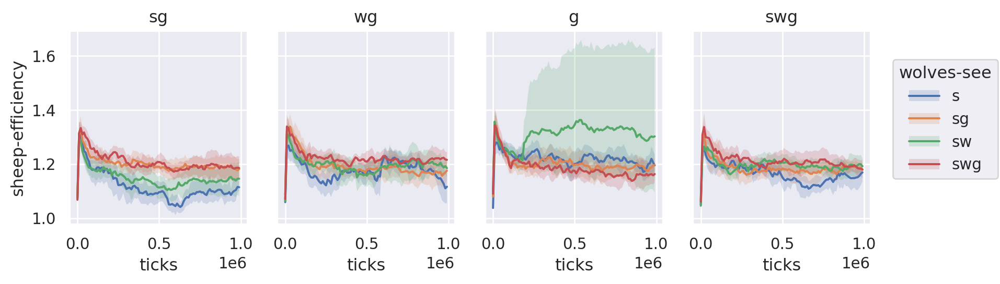

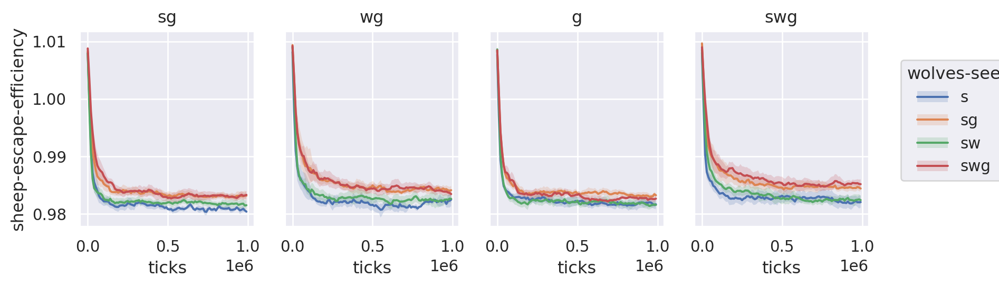

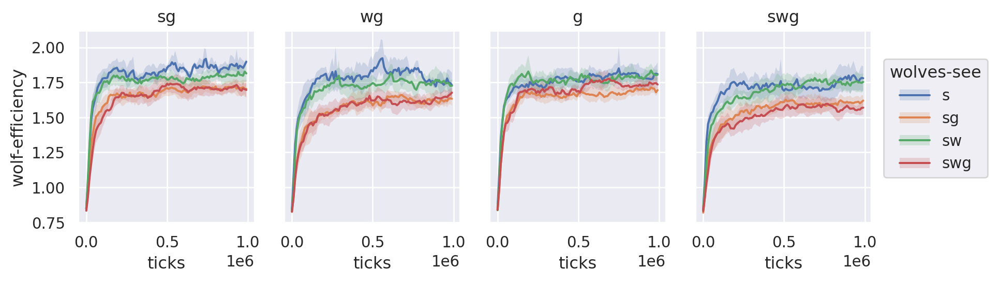

In [146]:
display(
    plot_effs_over_time(
        both_perc_agg_df, "sheep-efficiency", "sheep_eff", "wolves-see", "sheep-see"
    )
)
display(
    plot_effs_over_time(
        both_perc_agg_df,
        "sheep-escape-efficiency",
        "sheep_esc",
        "wolves-see",
        "sheep-see",
    )
)
display(
    plot_effs_over_time(
        both_perc_agg_df, "wolf-efficiency", "wolf_eff", "wolves-see", "sheep-see"
    )
)
